In [2]:
import layoutparser as lp

import matplotlib.pyplot as plt

%matplotlib inline
from pdf2image import convert_from_path

import numpy as np
import pandas as pd

from sklearn.cluster import DBSCAN
from sklearn import metrics
import seaborn as sns

## Turning PDF into Images 

In [3]:
images = convert_from_path('/home/davibarreira/Desktop/qdoc.tips_soares-glaucio-ary-dillon-a-democracia-interrompid.pdf')

## Example of Applying OCR in one Page

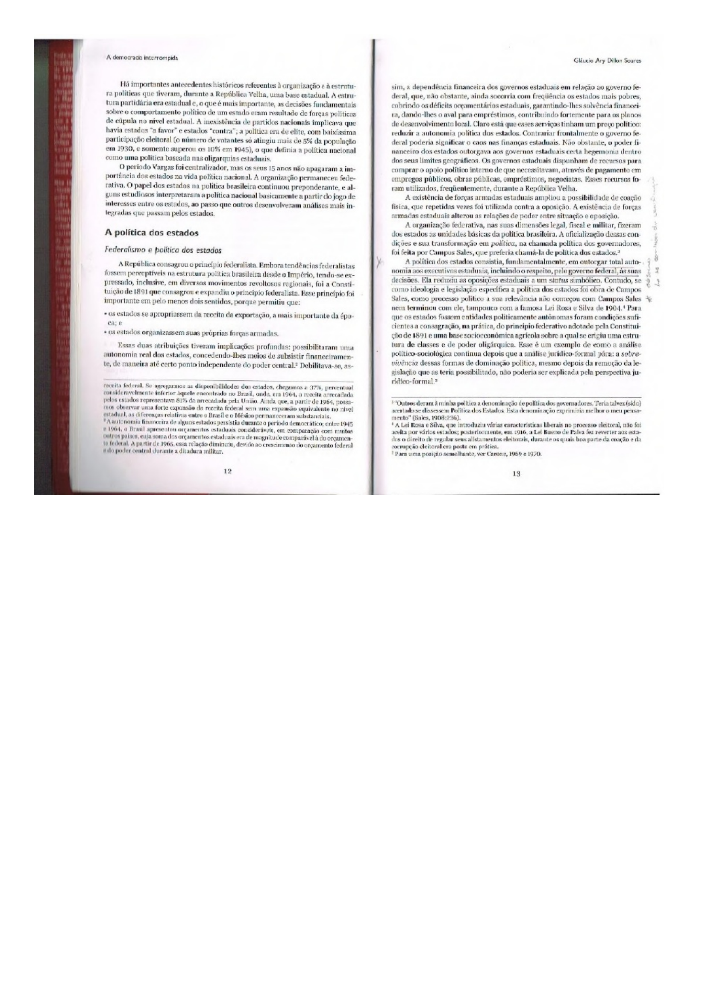

In [79]:
image = images[7]
image

In [175]:
ocr_agent = lp.TesseractAgent(languages='por')

res = ocr_agent.detect(image, return_response=True)
layout = ocr_agent.gather_data(res, agg_level=lp.TesseractFeatureType.WORD)


Let's visualize how our OCR.

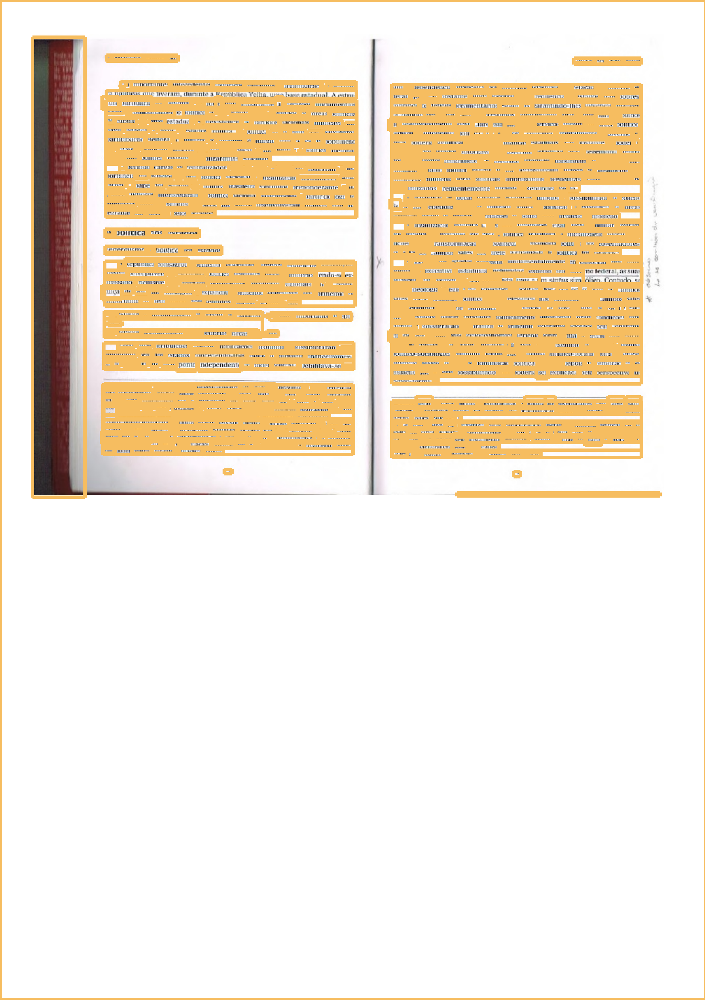

In [176]:
lp.draw_box(image, layout)

It worked, but we got more than what we wanted. We just need the text in each page. Also,
we need to break the content by page.

The layoutparser package has a filtering function.

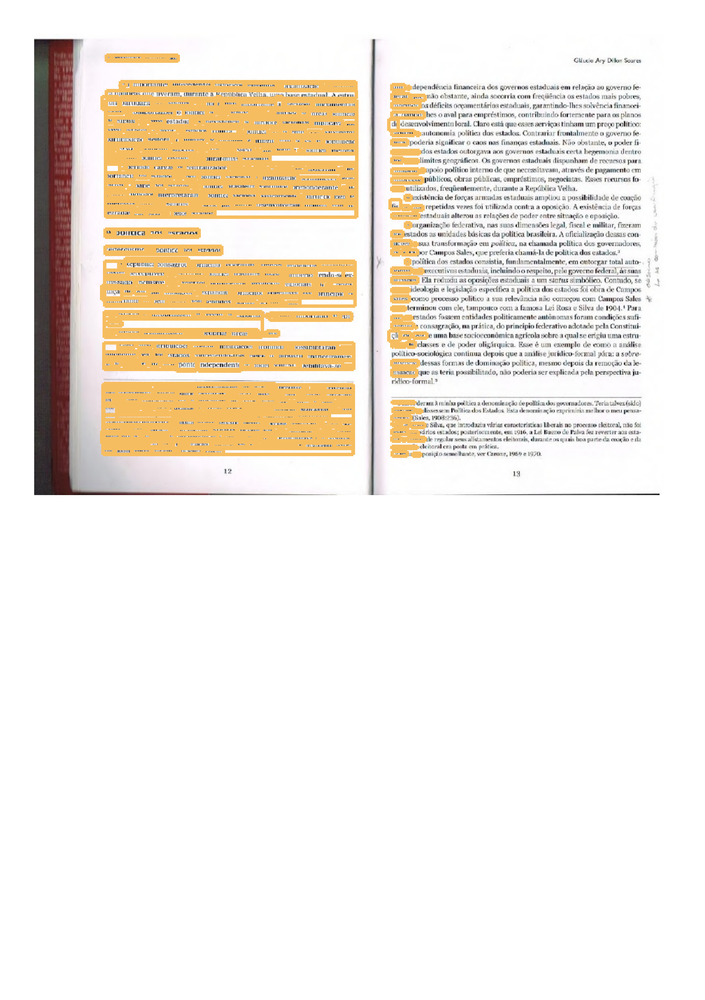

In [177]:
layout_filter =  layout.filter_by(lp.Rectangle(x_1=70, y_1=100, x_2=1000, y_2=1100))
lp.draw_box(image, layout_filter)

This works... But we need to know the proper filtering range. 

## Finding the Filtering Range

To find the filtering range we'll use the DBSCAN clustering algorithm based on the positions of the text.
These positions are found inside the `layout` object from the layoutparser package.

In [178]:
dl = layout.to_dataframe()
# X = pd.DataFrame({'x':dl.x_1, 'y':dl.y_1})

X = pd.DataFrame({'x': pd.concat([dl.x_1, dl.x_2]), 'y':pd.concat([dl.y_1, dl.y_2])})

<AxesSubplot: xlabel='x', ylabel='y'>

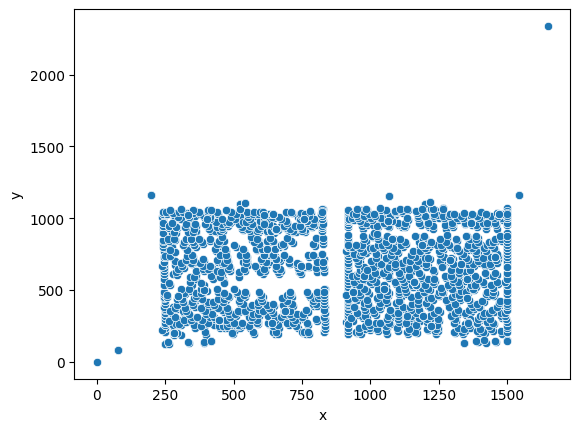

In [179]:
sns.scatterplot(X,x='x',y='y')

We can see that there are two clear rectangles. We'll use the clustering algorithm to find such squares.

The method involves using the DBSCAN algorithm with different values for the minimum neighbour distance (given by the `eps` parameter).
As we increase the `eps`, the number of clusters reduces. We sum the number of points in the largest two clusters.
Once the largest two clusters compose more than 85% (rule of thumb), then we assum that the clusters
are capturing the two squares.

We then use the values of the largest and smallest y and x coordinates in each cluster, in order to obtain the
coordinates of the encompassing rectangles.

In [180]:
"""
get_eps(X)

This function returns the `eps` value for which the two largest
clusters encompass more than 85% of all points.
"""
def get_eps(X):
    percentcovered = []
    for i in range(50,90,2):
        db = DBSCAN(eps=i, metric='manhattan').fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        # Number of clusters in labels, ignoring noise if present.
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_ = list(labels).count(-1)

        # clusters = np.unique(labels)[np.argsort(np.unique(labels,return_counts=True)[1])[-2:]]
        clusters = np.unique(labels, return_counts=True)

        percentcovered.append([i, sum(clusters[1][np.argsort(clusters[0])[-2:]])/len(labels)])
        perc = sum(clusters[1][np.argsort(clusters[0])[-2:]])/len(labels)
        if perc > 0.85:
            return i
    return i

In [181]:
"""
get_limits(X, eps)

Returns the coordinates of the encompassing rectangles.

"""
def get_limits(X, eps):
    db = DBSCAN(eps=eps, metric='manhattan').fit(X)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    X['label'] = labels

    # Number of clusters in labels, ignoring noise if present.
    clusters = np.unique(labels)[np.argsort(np.unique(labels,return_counts=True)[1])[-2:]]
    print(np.argsort(np.unique(labels, return_counts=True)[1])[-2:])
    print(np.unique(labels, return_counts=True))
    
    page = {'page0':{}, 'page1':{}}
    for i in [0,1]:
        df = X[X.label == clusters[i]]
        page['page'+str(i)]['xmin'] = np.min(df.x)
        page['page'+str(i)]['xmax'] = np.max(df.x)
        page['page'+str(i)]['ymin'] = np.min(df.y)
        page['page'+str(i)]['ymax'] = np.max(df.y)
        
        
    # Here is a small trick to take the same y values for both rectangles
#     page['page0']['ymax'] = np.minimum(page['page0']['ymax'],page['page1']['ymax']) + 10
#     page['page1']['ymax'] = page['page0']['ymax']
    
#     page['page0']['ymin'] = np.maximum(page['page0']['ymin'],page['page1']['ymin']) - 10
#     page['page1']['ymin'] = page['page0']['ymin']
    return page


[3 4]
(array([-1,  0,  1,  2,  3]), array([  22,    6,    6, 1082, 1190]))


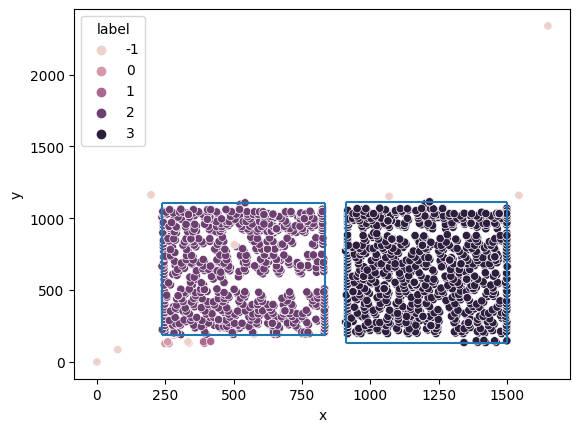

In [182]:
page = get_limits(X,get_eps(X))

sns.scatterplot(data=X, x='x', y='y', hue='label')
for i in ['page0','page1']:
    plt.hlines(page[i]['ymax'],page[i]['xmin'],page[i]['xmax'])
    plt.hlines(page[i]['ymin'],page[i]['xmin'],page[i]['xmax'])
    plt.vlines(page[i]['xmax'],page[i]['ymin'],page[i]['ymax'])
    plt.vlines(page[i]['xmin'],page[i]['ymin'],page[i]['ymax'])

Note that each page will have a different size. But let's use this size of the rectangle to capture the text.  

The idea is then to try to find the correct corner from where to placec the squares.

In [183]:
width = page['page0']['xmax'] - page['page0']['xmin'] + 20
height= page['page0']['ymax'] - page['page0']['ymin'] + 20

gap = page['page1']['xmin'] - page['page0']['xmax'] - 20

In [358]:
corner = (238,190)

def get_coordinates(corner):
    page = {'page0':{}, 'page1':{}}
    page['page0']['x_1'] = corner[0]
    page['page0']['y_1'] = corner[1]
    page['page0']['x_2'] = corner[0] + width
    page['page0']['y_2'] = corner[1] + height
    
    page['page1']['x_1'] = page['page0']['x_2'] + gap
    page['page1']['y_1'] = corner[1]
    page['page1']['x_2'] = page['page0']['x_2'] + gap + width
    page['page1']['y_2'] = corner[1] + height
    
    return page


def filter_by_corner(layout, corner, page='page0'):
    coord = get_coordinates(corner)
    layout_filter =  layout.filter_by(lp.Rectangle(x_1=coord[page]['x_1'],
                                                   y_1=coord[page]['y_1'],
                                                   x_2=coord[page]['x_2'],
                                                   y_2=coord[page]['y_2']
                                                  ))
    return layout_filter

In [185]:
coord = get_coordinates(corner)
coord

{'page0': {'x_1': 238, 'y_1': 190, 'x_2': 854, 'y_2': 1128},
 'page1': {'x_1': 910, 'y_1': 190, 'x_2': 1526, 'y_2': 1128}}

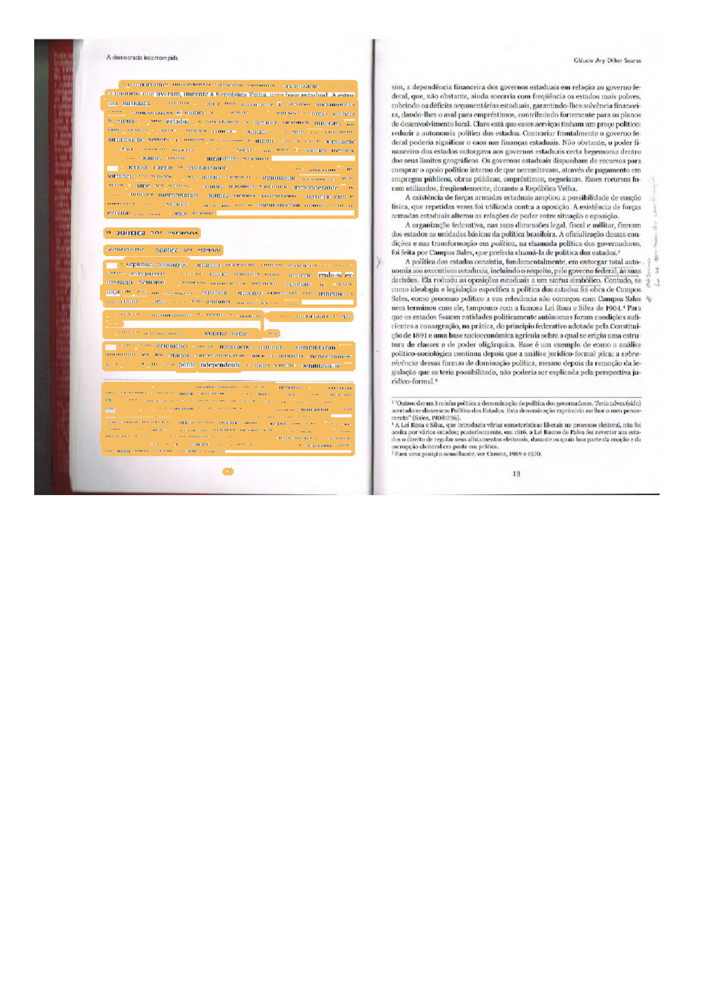

In [186]:
layout_filter = filter_by_corner(corner, 'page0')
lp.draw_box(image, layout_filter)

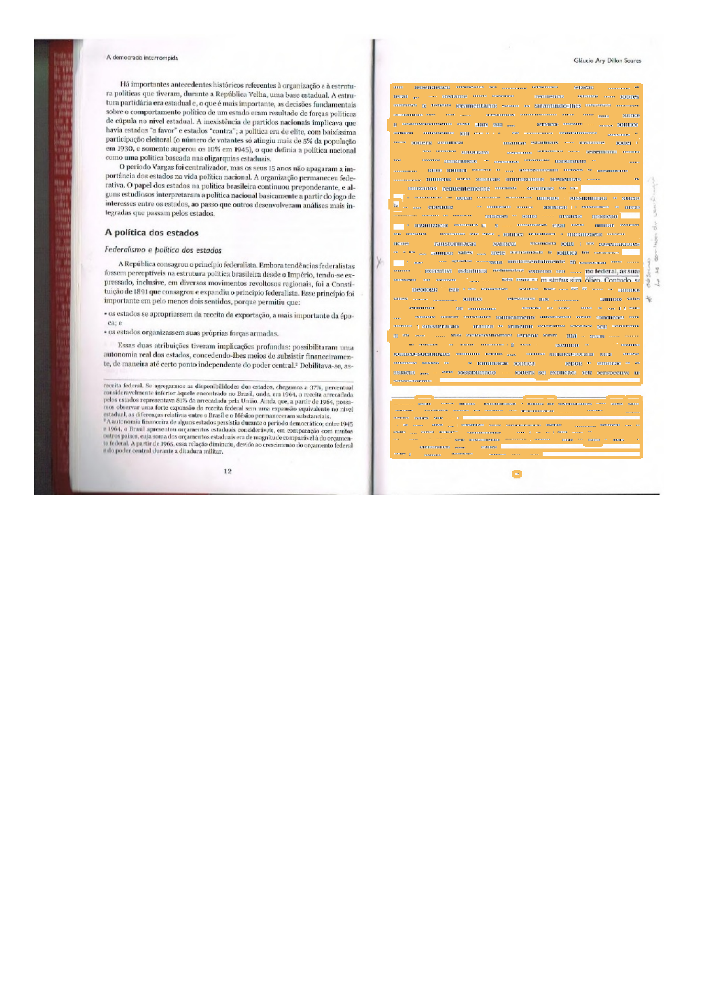

In [187]:
layout_filter = filter_by_corner(corner, 'page1')
lp.draw_box(image, layout_filter)

## Obtaining Text

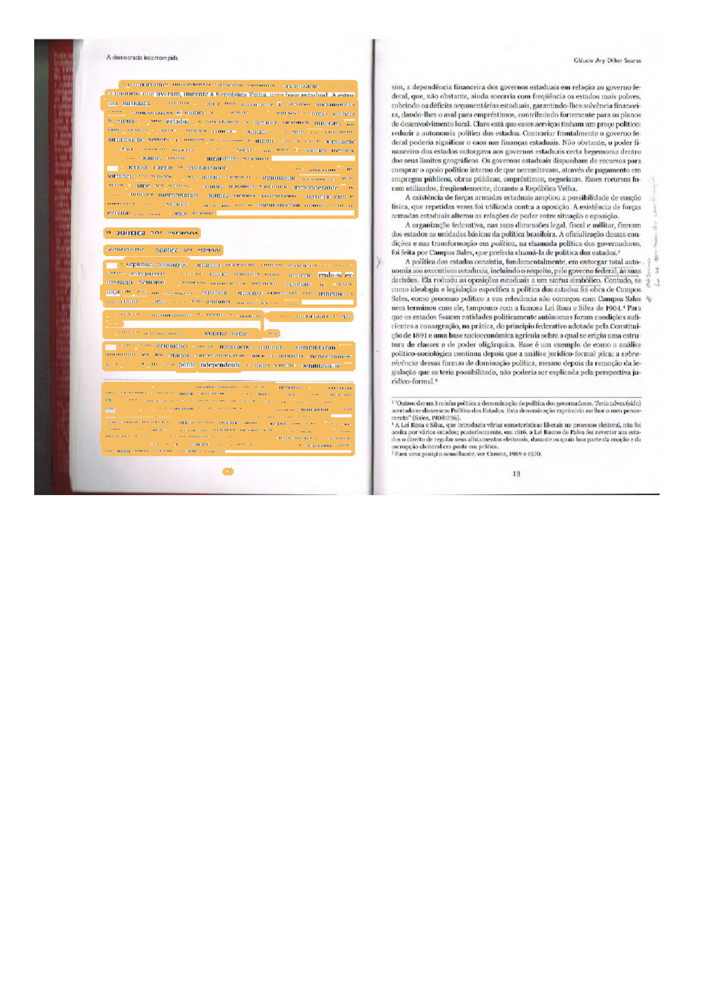

In [189]:
ocr_agent = lp.TesseractAgent(languages='por')

res = ocr_agent.detect(image, return_response=True)
layout = ocr_agent.gather_data(res, agg_level=lp.TesseractFeatureType.WORD)
layout_filter = filter_by_corner(corner, 'page0')
lp.draw_box(image, layout_filter)

In [324]:
dl = layout_filter.to_dataframe()

In [325]:
diff_y_1 = []
for i, row in dl.iterrows():
    if i == 0:
        diff_y_1.append(0)
    else:
        diff_y_1.append(row['y_1'] - dl.y_1.iloc[i-1])
        
dl['diff_y_1'] = diff_y_1
dl['font_height'] = dl.apply(lambda row: row['y_2'] - row['y_1'], axis=1)

In [328]:
text = ''
for i, row in dl.iterrows():
    if row['diff_y_1'] > 13:
        text = text + '\n'
    text = text + ' ' + row['text']
    
lines = [i.strip() for i in text.splitlines()]

Text = '\n'.join(lines)

In [331]:
print(Text)

Há importantes antecedentes históricos referentes à organização e à estrotu-
tura partidária era estadual e, o que é mais importante, as decisões fundamentais
sobre o comportamento político de um estudo eram resultado de forças políticas
de cúpula no nível L. A inexistência de partidos nacionais implicava que  havia estados “a favor” e estados “contra”; a política era de elite, com baixíssima
participação eleitoral (o múmero de votantes só atingiu imais de 5% da população
em 1930, e somente superou os 10% em 1945), a que definia à política nacional
cotno uma política bascada nas oligarquias estaduais,
O perindo Vargas foi centralizador, mas os seus 15 anos não apagaram a im-
portância dos estados na vida política nacional. A organização permaneceu fede
tativa, O papel dos estados na política brasileira continuou preponderante, e al-
guns estudiosos interpretaram a política nacional basicamente a partirdo jogo de
interesses entre os estados, ao passo que outros desenvolveram análises ma

### It worked.

The code worked fairly well. Let's write a function an apply it to the whole thing.

In [378]:
corner = (238,190)

def get_text_page(layout, corner, page):
    layout_filter = filter_by_corner(layout, corner, page)
    dl = layout_filter.to_dataframe()
    diff_y_1 = []
    for i, row in dl.iterrows():
        if i == 0:
            diff_y_1.append(0)
        else:
            diff_y_1.append(row['y_1'] - dl.y_1.iloc[i-1])

    dl['diff_y_1'] = diff_y_1
    dl['font_height'] = dl.apply(lambda row: row['y_2'] - row['y_1'], axis=1)
    
    text = ''
    for i, row in dl.iterrows():
        if row['diff_y_1'] > 13:
            text = text + '\n'
        text = text + ' ' + row['text']

    lines = [i.strip() for i in text.splitlines()]

    Text = '\n'.join(lines)
    return Text
    
def extract_text(img):
    
    ocr_agent = lp.TesseractAgent(languages='por')

    res = ocr_agent.detect(img, return_response=True)
    layout = ocr_agent.gather_data(res, agg_level=lp.TesseractFeatureType.WORD)
    
    text1 = get_text_page(layout, corner, 'page0')
    text2 = get_text_page(layout, corner, 'page1')
    
    return text1, text2

In [366]:
text1, text2 = extract_text(image)


KeyboardInterrupt



In [379]:
x, y = extract_text(images[5])

In [403]:
from tqdm import tqdm

In [404]:
Paginas = []
for image in tqdm(images[5:-2]):
    x, y = extract_text(image)
    Paginas.append(x)
    Paginas.append(y)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 187/187 [42:55<00:00, 13.77s/it]


In [409]:
Livro = '\n###PAGEBREAK###\n'.join(Paginas)

In [411]:
#open text file
text_file = open("./livro_text.txt", "w")
 
#write string to file
text_file.write(Livro)
 
#close file
text_file.close()

## Producing a PDF

The previous example saved the extracted text in a TXT file. This leads to some lost
in the overall strucuter of the text.

In [412]:
from fpdf import FPDF

pdf = FPDF()
pdf.add_page()
pdf.set_font('Arial', 'B', 16)
pdf.cell(40, 10, 'Hello World!')
pdf.output('tuto1.pdf', 'F')

''